# Getting Started

Welcome to the ALS tutorial on Ptychography! For reference, there are a few tips and tricks for running a jupyter notebook and instructions on how to setup the conda environment on the github repo: https://github.com/aditter/ALSPtychoTutorial.

We need to import the packages in the cell below to import libraries that are used in the rest of the tutorial. If this cell doesn't work, make sure the notebook is using the ptycho-tutorial conda environment. This is at the top right, just to the right of the bug lists the kernel. Click on that and use the dropdown to find the ptycho-tutorial environment. If it isn't in the list, open a new terminal and run the following command:

```
$ bash setup.sh
```

Clicking on a cell will select it. Pressing shift + enter will run the code in that cell.

In [36]:
# h5py for loading data which is stored in an hdf5 file.
import h5py
# matplotlib for plotting
import matplotlib.pyplot as plt
import matplotlib.animation
# scientific python modules for analyzing data
import numpy as np
import scipy
import skimage
import sklearn
# We have to import this specific function. Probably because it is not meant to be used really.
from skimage.registration._phase_cross_correlation import _upsampled_dft
#os and glob for handling files
import os
import glob
#json to parse string into dict
import json



#matplotlib paramters for animations
%matplotlib inline
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 150
plt.rcParams['animation.embed_limit'] = 200

The following functions are also used in the rest of the tutorial. These are similar to data analysis tools we use at the beamline but a bit simplified and laid out explicitly so that interested users can look at them or reproduce them for themselves.

In [38]:
#Code for running tutorial. Press shift + enter to run. If this cell gets expanded, you can click on the (blue) bar at the left to collapse it again.

#Path to where the example data is stored for this tutorial.
datapath = '/global/cfs/cdirs/als/gsharing/bl701/PtychoTutorial/'

#Functions to load a cxi or mat file, keeping only the parts we want.
def load_from_matfile(scan,energy = 0, region = 0,trim = 450,base = datapath):
    filename = os.path.join(base,'NS_{}_ccdframes_{}_{}_full.mat'.format(scan,energy,region))
    mat = scipy.io.loadmat(filename)
    return({'data':mat['obj'][trim:-trim,trim:-trim],'energy':0})

def load_from_cxi(scan,energy = 0, region = 0,base = datapath):
    filename = os.path.join(base,'NS_{}_ccdframes_{}_{}.cxi'.format(scan,energy,region))
    with h5py.File(filename,'r',swmr=True) as cxi:
        data = cxi['entry_1/image_1/data_cropped'][()]
        energy = json.loads(cxi['metadata'][()].decode('utf-8'))['energy']
    return({'data':data,'energy':energy})


class stack():

    def __init__(self,scan=None,region = 0,base = datapath,filetype = 'mat'):

        #If scan is None, the default is empty. We can then add raw_data and energies manually.
        if scan is not None:
            
            if filetype == 'cxi':
                #We actually only need the number of energies rather than the filenames.
                cxi_num = len(glob.glob(os.path.join(base,'NS_{}_ccdframes_*_{}.cxi'.format(scan,region))))
                imported = [load_from_cxi(scan,energy = i, region = region, base = base) for i in range(cxi_num)]
            elif filetype == 'mat':
                mat_num = len(glob.glob(os.path.join(base,'NS_{}_ccdframes_*_{}_full.mat'.format(scan,region))))
                imported = [load_from_matfile(scan,energy = i, region = region, base = base) for i in range(mat_num)]
            self.raw_data = [d['data'] for d in imported]
            if filetype == 'cxi':
                self.energies = [d['energy'] for d in imported]
            elif filetype == 'mat':
                stxm_filename = os.path.join(base,'NS_{}.stxm'.format(scan))
                with h5py.File(stxm_filename,'r',swmr=True) as stxm_file:
                    self.energies = stxm_file['entry0/energy/energy'][()]
    
            
            #Images may not be exactly the same shape, so we trim them all to the minimum. It's usually only a pixel or so.
            minshape = np.min([image.shape for image in self.raw_data],axis = 0)
            self.raw_data = np.array([image[:minshape[0],:minshape[1]] for image in self.raw_data])

        #get some random colors for the clusters and spectra plots
        self.penColors = [(1,0,0),(0,1,0),(0,0,1),(1,1,0),(1,0,1),(0,1,1)]
        totalColors = len(self.penColors)
        while totalColors <= 100:
            color = list(np.random.choice(range(256), size=3))
            if sum(color) / 3. > 80.:
                self.penColors.append(color)
                totalColors += 1
                


    def align(self,mode = 'translation'):
        self.shifts = []
        self.aligned_data = self.raw_data.copy()
        
        #Find the shift from skimage phase cross correlation. Doesn't really work. This is my own personal hobby horse, you can ignore this.
        if mode == 'skimage pcc':
    
            for image in self.aligned_data:
                self.shifts.append(skimage.registration.phase_cross_correlation(np.abs(self.aligned_data[0]),np.abs(image),upsample_factor = 10)[0])

        if mode == 'translation':

            #This is a method actually following the paper mentioned in skimage: https://ieeexplore.ieee.org/document/6111478
            #No idea why this works beter then skimage but it does...
            newsize = np.max((self.aligned_data[0].shape[0]+self.aligned_data[0].shape[0]-1,
                              self.aligned_data[0].shape[1]+self.aligned_data[0].shape[1]-1))
            shp = (newsize,newsize)
            center = np.fix(np.array(shp)/2)
            
            #We align to the first image of the dataset.
            src_image = self.aligned_data[0]
            src_im_pad = np.pad(src_image,[(0,newsize-src_image.shape[0]),(0,newsize-src_image.shape[1])])
            
            #We create an image showing where the original image is nonzero.
            src_mask_pad = np.pad(np.ones(src_image.shape),[(0,newsize-src_image.shape[0]),(0,newsize-src_image.shape[1])])

            #we can calculate a few of the fourier transforms outside of the for loop.
            f2 = np.fft.fft2(src_im_pad).conj()
            m2 = np.fft.fft2(src_mask_pad).conj()
            for image in self.aligned_data:

                #The rest of the images and fourier transforms have to be calculated in the loop.
                dst_im_pad = np.pad(image,[(0,newsize-image.shape[0]),(0,newsize-image.shape[1])])
                dst_mask_pad = np.pad(np.ones(image.shape),[(0,newsize-image.shape[0]),(0,newsize-image.shape[1])])
                
                f1 = np.fft.fft2(dst_im_pad)
                f21 = np.fft.fft2(dst_im_pad*dst_im_pad)
                f22 = np.fft.fft2(src_im_pad*src_im_pad).conj()
                m1 = np.fft.fft2(dst_mask_pad)

                #These are the pieces of the overall correlation. ovl is the overlap of the two masks and is used in several places.
                #This is required to be greater than 0.3 times its maximum to keep the correlation at reasonable pixel shifts.
                #Other inverse fourier transforms could be calculated once to make it faster probably.
                ovl = np.fft.ifft2(m1*m2)
                ovl_req = 0.3
                
                num = np.fft.ifft2(f1*f2)-(np.fft.ifft2(f1*m2)*np.fft.ifft2(m1*f2))/ovl
                den1 = np.fft.ifft2(f21*m2)-np.fft.ifft2(f1*m2)**2/ovl
                den2 = np.fft.ifft2(f22*m1)-np.fft.ifft2(f2*m1)**2/ovl
                
                roughcc = np.where(ovl>np.max(ovl)*ovl_req,num/np.sqrt(den1*den2),0)
                
                #The shift is then the maximum of this cross correlation.
                roughshift = np.array(np.unravel_index(np.argmax(np.abs(roughcc)),shp))
                roughshift[roughshift>center] -= np.array(shp)[roughshift>center]


                upsample = 10
                upsampled_region_size = upsample*2
                #This is to take into account the existing rough shift so we don't have to upsample the whole image.
                upsampled_shift = np.fix(upsampled_region_size/2)-roughshift*upsample
                #Here is our upsampling function. I don't think this is slow to define this here?
                def upsampled_ifft2(im):
                    return(_upsampled_dft(im.conj(),upsampled_region_size,upsample,upsampled_shift).conj())

                #This is all the same, just using the new inverse fft.
                fineovl = upsampled_ifft2(m1*m2)
                finenum = upsampled_ifft2(f1*f2)-(upsampled_ifft2(f1*m2)*upsampled_ifft2(m1*f2))/fineovl
                fineden1 = upsampled_ifft2(f21*m2)-upsampled_ifft2(f1*m2)**2/fineovl
                fineden2 = upsampled_ifft2(f22*m1)-upsampled_ifft2(f2*m1)**2/fineovl
            
                #We don't worry about overlap here, assume that has been taken care of in the rough shift.
                finecc = finenum/np.sqrt(fineden1*fineden2)
                fineshift = np.array(np.unravel_index(np.argmax(np.abs(finecc)),(upsampled_region_size,upsampled_region_size)))
                #Finally we add back in the rough shift.
                totshift = (fineshift-upsampled_shift)/upsample

                
                self.shifts.append(totshift)

        for i in range(len(self.aligned_data)):
            self.aligned_data[i] = scipy.ndimage.shift(self.aligned_data[i],-self.shifts[i],order = 1)

        #Finally, we trim the image based on the shifts calculated
        trim_right, trim_up = -np.floor(np.min(self.shifts,axis=0)).astype(int)
        trim_left, trim_down = -np.ceil(np.max(self.shifts,axis = 0)).astype(int)
        if trim_left == 0:
            trim_left = None
        if trim_down == 0:
            trim_down = None
        self.aligned_data = self.aligned_data[:,trim_right:trim_left,trim_up:trim_down]

    def calc_OD(self):

        #Check if image is aligned. If not, then align first (doesn't need to be done this way probably but it makes this easier).
        try:
            len(self.aligned_data)
        except:
            print('run stack.align() before calculating optical density')
            
        #Set a threshold at 90% of maximum intensity less minimum intensity.
        av_im = np.mean(np.abs(self.aligned_data),axis = 0)
        I0_threshold = (av_im.max()-av_im.min())*0.9+av_im.min()
        self.I0_mask = av_im>I0_threshold
        self.I0 = np.sum(np.abs(self.aligned_data)*self.I0_mask,axis = (1,2))/np.sum(self.I0_mask)
        
        #This is dividing I0 by the data. The transposes are there to make the data in a shape where numpy can do the division and then to change back.
        self.od_data = np.log(self.I0/np.abs(self.aligned_data).transpose((1,2,0))).transpose((2,0,1))

        #We also calculate the phase here.
        self.phase_data = np.angle(self.aligned_data)

    def pcaFilterImages(self, nPC = 5):
        """
        This uses the sklearn.decomposition.pca to compute eigenVectors and eigenVals from the odFrames.
        It then computes pcaImages which is dot(odFrames,eigenVectors) and pcaFilteredImages which
        is pca.inverse_transform(nPC).  filteredImages is a model of the data with noisy components
        removed.  pcaImages is a representation of all eigenVectors as (nEnergiesxMxN).
        :param nPC: int.  Number of components to use in pcaFilteredImages
        :return:
        """
        try:
            self.od_data
        except:
            print('Calculate OD first using stack.calc_od')
        #Filter the data to the requested number of principle components. This improves noise.
        self.nEnergies, self.nY, self.nX = self.od_data.shape
        self.nPixels = self.nY * self.nX
        p = np.reshape(np.transpose(self.od_data, axes = (1,2,0)), (self.nPixels, self.nEnergies), order = 'F')
        self.pca = sklearn.decomposition.PCA(n_components = self.nEnergies)
        self.pca.fit(np.dot(p.T,p.conjugate()))
        perm = np.argsort(-np.abs(self.pca.explained_variance_))
        self.eigenVals = self.pca.explained_variance_[perm]
        self.eigenVecs = self.pca.components_[:,perm].T
        self.pcaImages = np.transpose(np.reshape(np.dot(p, self.eigenVecs),(self.nY, self.nX, self.nEnergies), order = 'F'), axes = (2,0,1))
        self.pca = sklearn.decomposition.PCA(n_components = nPC)
        self.pca.fit(p)
        c_pca = self.pca.transform(p)
        self.filteredImages = self.pca.inverse_transform(c_pca)
        self.filteredImages = np.transpose(np.reshape(self.filteredImages, (self.nY, self.nX, self.nEnergies), order = 'F'), axes = (2,0,1))

    def calc_PCA(self, nPC = 4, pcaOffset = 0, nClusters = 4):
        """
        This function calls pcaFilterImages which computes a representation of the odFrames using a
        reduced number of principal components (pca.inverse_transform(nPC)).  This is used to reduce noise.  It also generates pcaImages
        which is dot(odFrames,eigenVectors).  Clustering currently is performed on pcaImages but this
        should be changed to pcaFilteredImages to reduce impact of noise.  Alternatively, one could compute
        dot(odFrames, eigenVectors(nPC)) for clustering.
        :param nPC: int.  Number of principal components to include in the decomposition.
        :param pcaOffset: int.  0 or 1.  Set to 1 to ignore the first PC and reduce mass thickness effects
        :param nClusters: int.  Number of clusters to generate.  This fails for large numbers of clusters.
        :param clustering: string.  Clustering algorithm.  dbscan is not working yet.
        :return:
        """
        try:
            self.od_data
        except:
            print('Calculate OD first using stack.calc_od')
            return
            
        self.pcaFilterImages(nPC = nPC)
        self.kmeansClusters(nClusters = nClusters, pcaOffset = pcaOffset)
        self.nnls(self.filteredImages, self.clusterSpectra)

    def nnls(self, imageData, targetSpectra):
        """
        This method uses non-negative least squares to solve for the maps of chemical weights.
        :param imageData: 3D numpy array (nEnergiesxMxN)
        :param targetSpectra: list. Each element is 1D numpy (nEnergies,1)
        :return:
        """
        nSpectra = len(targetSpectra) #list of spectra
        targetSpectra = np.vstack(targetSpectra).T #convert to matrix
        imageData = np.transpose(imageData,axes = (1,2,0))
        nY, nX, nEnergies = imageData.shape
        imageData = np.reshape(imageData, (nY * nX, nEnergies)).T
        X = np.zeros((nSpectra, imageData.shape[1]))
        resids_nnls = np.zeros(imageData.shape[1]) 

        for i in np.arange(imageData.shape[1]):
            X[:, i], resids_nnls[i] = scipy.optimize.nnls(targetSpectra, imageData[:, i])
        self.rMap = np.reshape(resids_nnls, (nY,nX))
        self.targetSVDmaps = np.reshape(X, (nSpectra,nY,nX))
        self.targetSpectra = targetSpectra.T


    def kmeansClusters(self, nClusters = 3, pcaOffset = 0):
        """
        Execute the kmeans2 clustering algorithm on the pcaImages.  pcaImages is dot(odFrames, eigenVectors)
        :param nClusters: int.  Number of clusters to generate.  Fails for large number of clusters.
        :param pcaOffset: int. 0 or 1.  Set to 1 to ignore the first PC and reduce mass thickness effects
        :return:
        """
        try:
            self.pcaImages
        except:
            print("kmeansClusters called before running pcaFilter. Probably don't call this on its own.")
            return
        
        self.clusters = np.zeros(self.nPixels)
        res, self.clusters = scipy.cluster.vq.kmeans2(np.reshape(np.transpose(self.pcaImages, \
            axes = (1,2,0))[:,:,pcaOffset:nClusters + pcaOffset],(self.nPixels, \
            nClusters), order = 'F'), nClusters)
        self.clusters = np.reshape(self.clusters, (self.nY, self.nX), order = 'F')
        self.clusterSpectra = []
        for i in range(nClusters):
            thisClusterSpectrum = (self.od_data * (self.clusters == i)).sum(axis = (1,2)) / (self.clusters == i).sum()
            thisClusterSpectrum[np.isnan(thisClusterSpectrum)] = 0.
            self.clusterSpectra.append(thisClusterSpectrum)

    def rgbClusterMap(self):
        """
        Creates an RGB image of the cluster map.
        :return (nx, ny, 3) array:
        """
        ny, nx = self.clusters.shape
        nClusters = self.clusters.max() + 1
        rgbClusterImage = np.zeros((ny,nx,3))
        for i in range(nClusters):
            rgbClusterImage += 255.* np.transpose(np.ones((3,ny,nx)) * (self.clusters == i).astype('float32'), \
                axes = (1,2,0)) * self.penColors[i]
        return rgbClusterImage.astype('uint8')
    
    def display_PCA(self):
        """
        Plots results of PCA/clustering.
        :return:
        """
        #Make a figure
        fig = plt.figure(figsize = (6,10))
        #Add a top subplot. This is for the clustermap.
        ax1 = fig.add_subplot(211)
        ax1.imshow(self.rgbClusterMap())
        #Add a bottom subplot. This is for the spectra.
        ax2 = fig.add_subplot(212)
        for i in range(len(self.clusterSpectra)):
            ax2.plot(self.energies, self.clusterSpectra[i], color = self.penColors[i],label = 'Cluster {}'.format(i))
        ax2.legend()
        ax2.set_xlabel('Energy (eV)')
        ax2.set_ylabel('Optical Density')

        plt.show()

    def background_subtract(self):
        """
        subtracts the first image of the stack from the entire stack, assuming this image is the background. Does PCA filtering first if there are more than 5 energies.
        """

        if len(self.energies)>5:
            self.pcaFilterImages(nPC = 5)
            self.od_data = self.od_data - self.filteredImages[0]
        else:
            self.od_data = self.od_data -self.od_data[0]

    def rgbMap(self,targetSpectra,rgb):
        """
        Uses the selected fitting routine to calculate a linear combination fit of targetSpectra to the
        filteredImages.
        :param targetSpectra: list of 1D numpy arrays of (nEnerges,1)
        :param rgb: length three list. (1,1,0) for red and green for examle.
        :return:
        """
        nColors = sum(rgb)
        if len(targetSpectra) != nColors:
            return
        if nColors < 2:
            return
        self.nnls(self.filteredImages, targetSpectra)
        rgbImage = np.zeros((self.nY, self.nX, 3), dtype = 'uint8')
        svdMaps = self.targetSVDmaps.copy()
        svdMaps = 255. * svdMaps / svdMaps.max()
        svdMaps = svdMaps.astype('uint8')
        if nColors == 3:
            for i in range(nColors): rgbImage[:,:,i] = svdMaps[i]
        else:
            if rgb[0] == 0:
                for i in range(nColors): rgbImage[:,:,i + 1] = svdMaps[i]
            elif rgb[1] == 0:
                rgbImage[:,:,0] = svdMaps[0]
                rgbImage[:,:,2] = svdMaps[1]
            else:
                rgbImage[:,:,0] = svdMaps[0]
                rgbImage[:,:,1] = svdMaps[1]

        return(rgbImage)

def animate_data(data,energies,px_size = 8):
    
    plt.clf()
    fig, ax = plt.subplots()

    im = plt.imshow(data[0])
    ax.set_title('Energy: {} eV'.format(energies[0]))
    plt.clim(data.min(),data.max())
    plt.colorbar()
    def animate(t):
    
        im.set_array(data[t])
        ax.set_title('Energy: {} eV'.format(energies[t]))
    
    ani = matplotlib.animation.FuncAnimation(fig, animate, frames=len(data))
    return(ani)

def normalize_spectrum(spectrum):
    return((spectrum-spectrum.min())/(spectrum.max()-spectrum.min()))

class XMCD_stack():

    def __init__(self, scan1, scan2,region1 = 0,region2 = 0,base = datapath,filetype = 'mat',autoprocess = False):

        #First load each dataset.
        self.stack1 = stack(scan1, region = region1, base = base, filetype = filetype)
        self.stack2 = stack(scan2, region = region2, base = base, filetype = filetype)

        #Next create a combined stack.
        self.combined_stack = stack()
        self.combined_stack.raw_data = [im for im in self.stack1.raw_data]+[im for im in self.stack2.raw_data]
        self.combined_stack.energies = np.concatenate((self.stack1.energies, self.stack2.energies))

        self.nE1 = len(self.stack1.energies)
        self.nE2 = len(self.stack2.energies)

        self.energies = self.stack1.energies
        #Images may not be exactly the same shape, so we trim them all to the minimum. It's usually only a pixel or so.
        minshape = np.min([image.shape for image in self.combined_stack.raw_data],axis = 0)
        self.combined_stack.raw_data = np.array([image[:minshape[0],:minshape[1]] for image in self.combined_stack.raw_data])

        if autoprocess:
            self.align()
            self.calc_OD()
            self.calc_XMCD()

    def align(self,mode = 'translation'):

        #Align the combined stack
        self.combined_stack.align(mode = 'translation')

        #Set the aligned_data of the two original stacks to be the correct portion of the combined stack.
        self.stack1.aligned_data = self.combined_stack.aligned_data[:self.nE1]
        self.stack2.aligned_data = self.combined_stack.aligned_data[self.nE1:]

    def calc_OD(self):

        #Calculate the OD for each stack.

        self.stack1.calc_OD()
        self.stack2.calc_OD()

    def calc_XMCD(self):

        #Normal XMCD is the od subtracted from eachother. 1-2 in this case.
        self.xmcd_data = self.stack1.od_data - self.stack2.od_data

        #Phase XMCD is the phase subtracted from eachother.
        self.xmcd_phase = self.stack1.phase_data - self.stack2.phase_data

        #XMCD stack is a stack with this data in it instead of the od data and phase data.

        self.xmcd_stack = stack()
        self.xmcd_stack.energies = self.energies
        self.xmcd_stack.od_data = self.xmcd_data
        self.xmcd_stack.phase_data = self.xmcd_phase
        

        


# Example: Permalloy Spin Ice Pattern

The first example is a permalloy (nickel, iron) spin ice pattern. The sample is magnetized in the plane of the sample and the sample is rotated relative to the beam so that when right circularly polarized light is incident on the sample, it will absorb differently than left circularly polarized light.

First we load the data. There are two stacks, one was taken with left circularly polarized light, one with right.

In [33]:
#Create a stack object (see above if interested in what this means)
SI_left_stack = stack('241213130')

For now, we'll just look at the left polarized stack. We can flip through the images of the stack with a nifty matplotlib animation

In [34]:
#This command turns matplotlib plot interactivity off. Unintuitively, that is what's necessary for the interactive plots.
plt.ioff()

In [35]:
animate_data(np.abs(SI_left_stack.raw_data),SI_left_stack.energies)

The image alignment function uses phase cross correlation, which covers a translation of the object. For some ptycho stacks, an affine or homomorphic translation may be better because of drift or sample movement.

In [6]:
SI_left_stack.align()

In [7]:
animate_data(np.abs(SI_left_stack.aligned_data),SI_left_stack.energies)

## Calculate Optical Density

The optical density is the absorption of the material multiplied by the thickness. There's an automatic function to calculate this that you can look at in the functions above if you want.

In [8]:
SI_left_stack.calc_OD()

In [9]:
animate_data(SI_left_stack.od_data,SI_left_stack.energies)

Now that we've calculated the optical density, we can use this to look at an average spectrum.

To go back to static plots, we have to run a few functions.

In [10]:
%%capture
plt.ion()
plt.show()

Text(0, 0.5, 'Average OD')

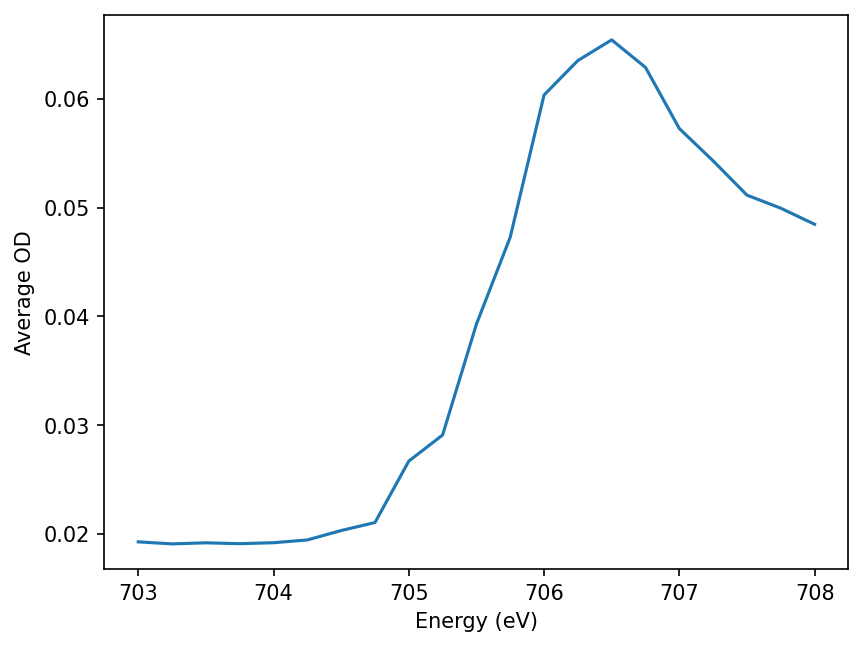

In [11]:
plt.plot(SI_left_stack.energies, np.mean(SI_left_stack.od_data,axis = (1,2)))
plt.xlabel('Energy (eV)')
plt.ylabel('Average OD')

Because this is a simple average over the entire image, the value of optical density is lower than you might expect. It is also a thin sample.

Ptychography spectra are often different from typical XAS spectra. The number of energies is often lower to minimize measurement time and you sometimes take only a few critical energies which are carefully selected. Even in this example, a finer stack would be more typical for a STXM measurement.

## PCA and K-means Clustering

With a stack of data, often principle component analysis and k-means clustering are used to identify clusters of spectra which are similar. This is often used to identify different chemical components which have different spectra.

This isn't very necessary here since we are expecting two spectra (from aligned and anti-aligned regions) but it will still be illustrative.

We'll run through the steps manually to show a bit of what's going on.

First we need to reshape the data in a way that the scikit-learn algorithm can handle.

In [12]:

nE,nx,ny = SI_left_stack.od_data.shape
pca = sklearn.decomposition.PCA(n_components = nE)
#reshape OD data to have energy first.
X = np.reshape(SI_left_stack.od_data,(nE,nx*ny))

Now we actually do the fitting. The explained variance tells how much of the data is explained by each component.

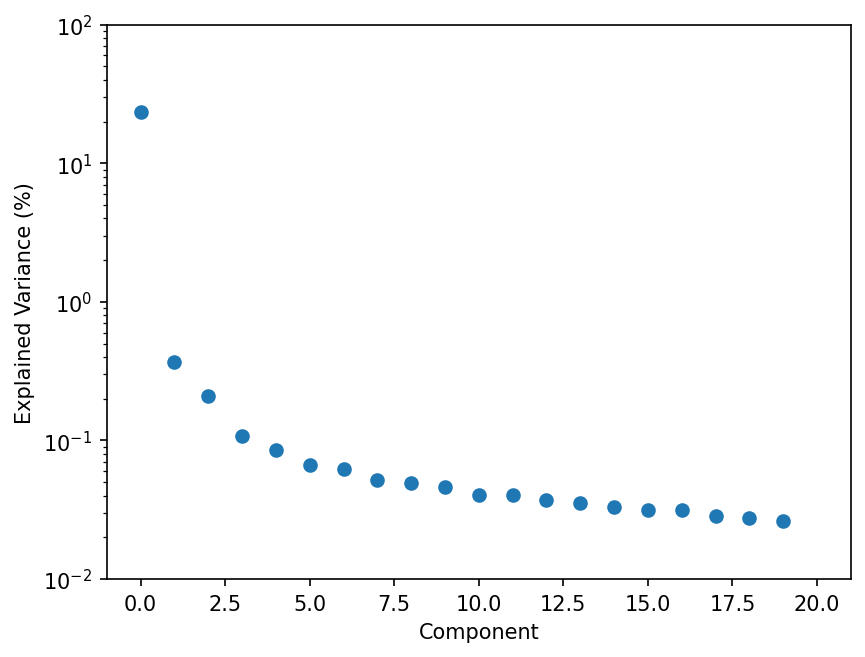

In [13]:
#Do the fit to get the principle components
X_transformed = pca.fit_transform(X)
fig,ax = plt.subplots()
plt.scatter(range(nE),pca.explained_variance_)
ax.set_yscale('log')
plt.ylim(10**-2,100)
plt.xlabel('Component')
plt.ylabel('Explained Variance (%)')
plt.show()

This tells us the first 5 or so components contain most of the information in the plot. We can look at a few of them.

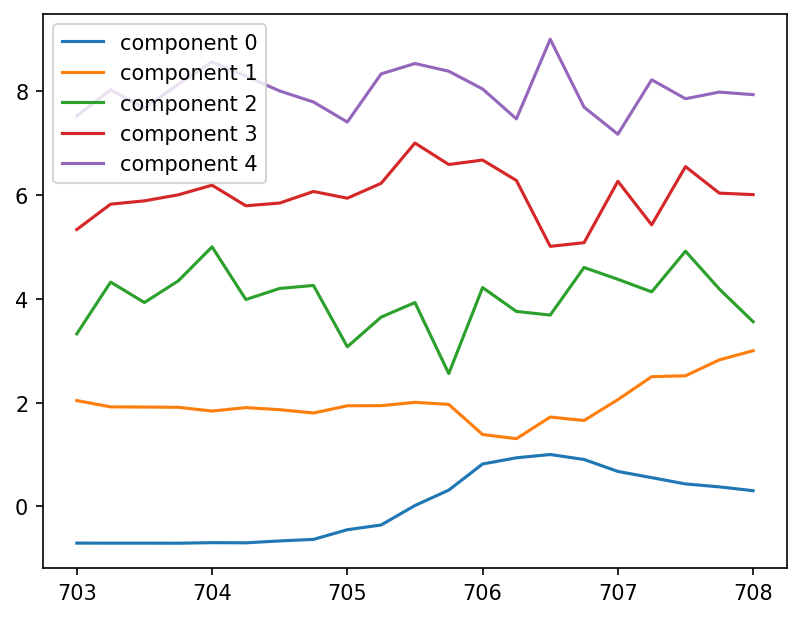

In [16]:
plot_components = range(0,5) #Change this to display different components.
for i in plot_components:
    plt.plot(SI_left_stack.energies,X_transformed[:,i]/np.max(X_transformed[:,i])+i*2,label = 'component {}'.format(i))
plt.legend()

We can also look at a scatterplot of the components against one another. This can be useful in determining which components may be important as they will show a trend or some sort of relation. These types of plots can also be useful in identifying clusters by eye.

Text(0, 0.5, 'Component 1')

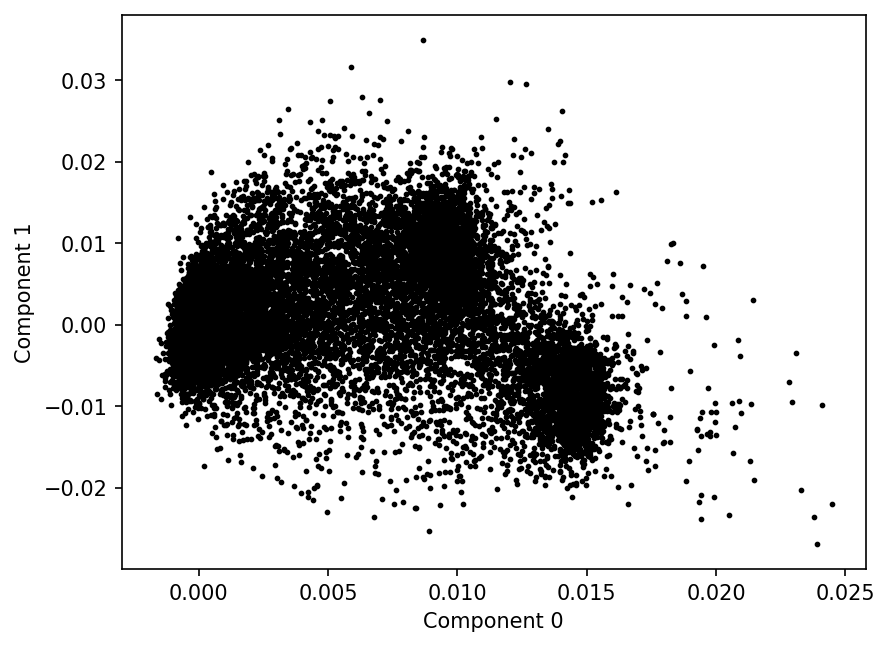

In [17]:
component_x = 0
component_y = 1
plt.scatter(pca.components_[component_x],pca.components_[component_y],s = 3,c = 'k')
plt.xlabel('Component {}'.format(component_x))
plt.ylabel('Component {}'.format(component_y))

Okay, we'll say that 4 of these components are important. And we'll look for three clusters. One background, and one of each polarization. We'll leave pcaOffset alone for now. What this function will do is calculate the principle components, filter out everything except the first four of them, and then use that reduced data to identify up to 3 clusters. Then we'll plot those clusters and the average spectrum of each.


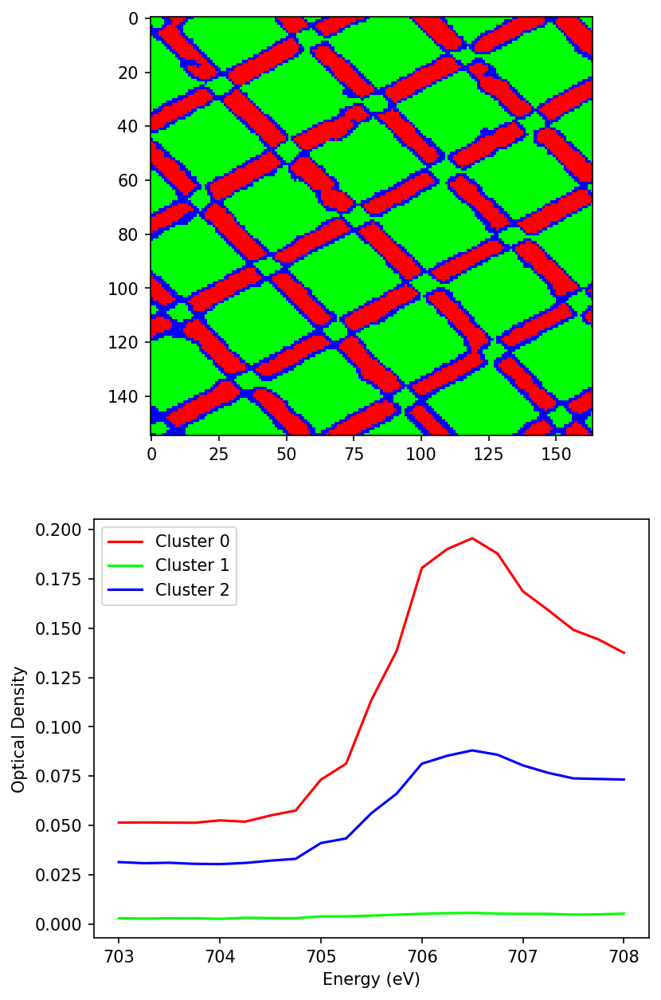

In [18]:
SI_left_stack.calc_PCA(nPC = 4, pcaOffset = 0, nClusters = 3)
SI_left_stack.display_PCA()

That didn't work too well. The clustering is mostly focused on how thick the sample is. The thickness information is encoded in the first PCA component, so we can use the PCA offset to fix this. When we set this to 1, the first component is ignored

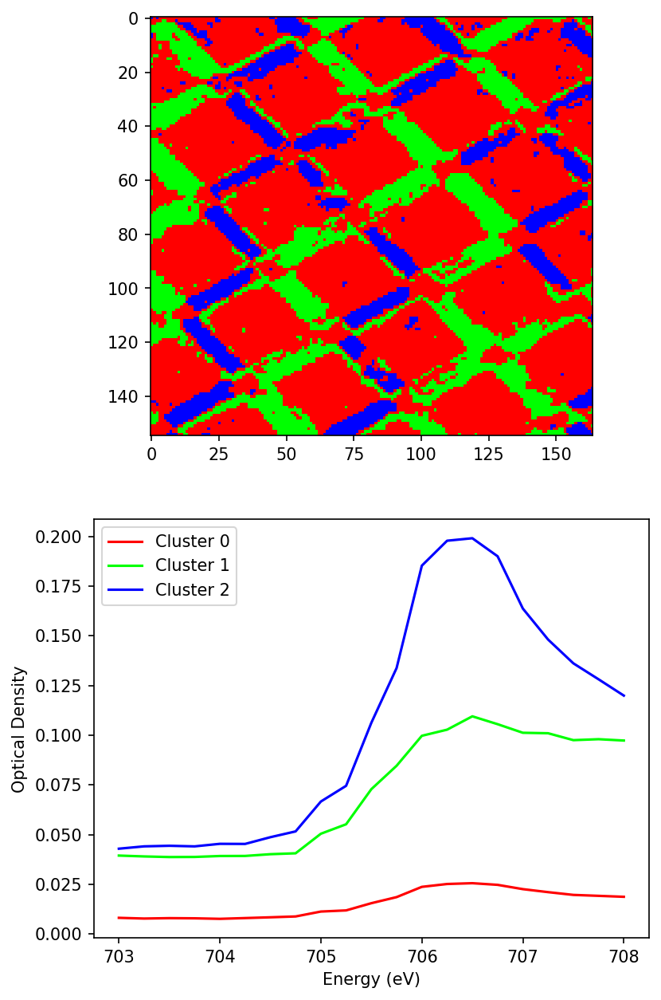

In [20]:
SI_left_stack.calc_PCA(nPC = 4, pcaOffset = 1, nClusters = 3)
SI_left_stack.display_PCA()

Much better! It's not perfect, but we can clearly see the difference in the two regions. We'll try one more which is background subtracted, but this doesn't seem to work very well. We're picking up a weird gradient here that wasn't there before. 

In [21]:
SI_left_stack.od_data = SI_left_stack.od_data-np.mean(SI_left_stack.od_data[0:3]) #To undo this, run calc_od again.

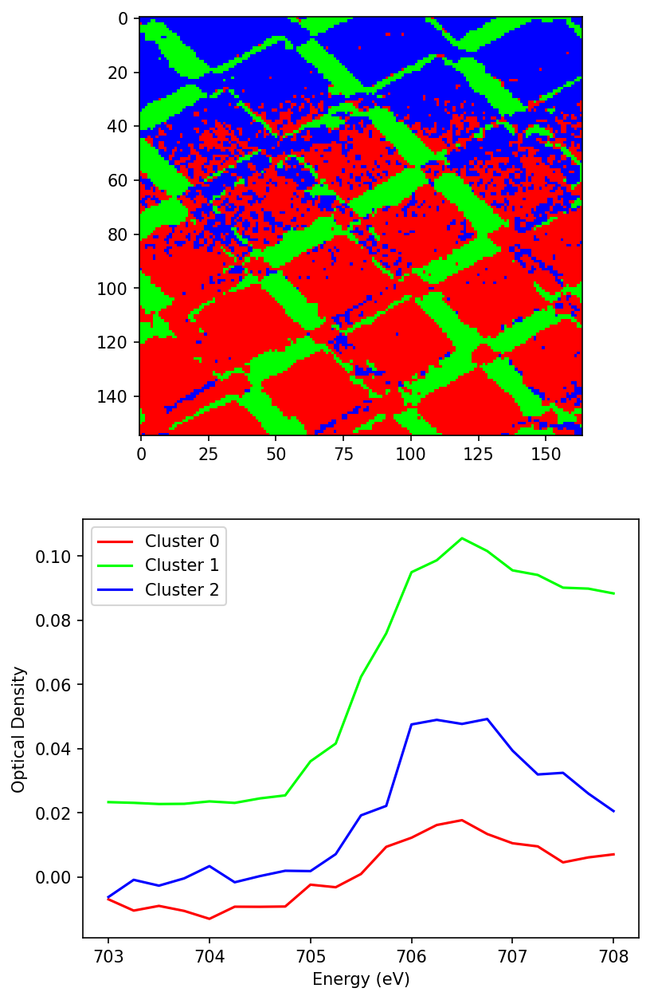

In [23]:
SI_left_stack.calc_PCA(nPC = 4, pcaOffset = 1, nClusters = 3)
SI_left_stack.display_PCA()

This still isn't perfect. Some combination of running this can give you something that looks pretty good but it's unsatisfying. We'll go back to the offset without background subtracting.

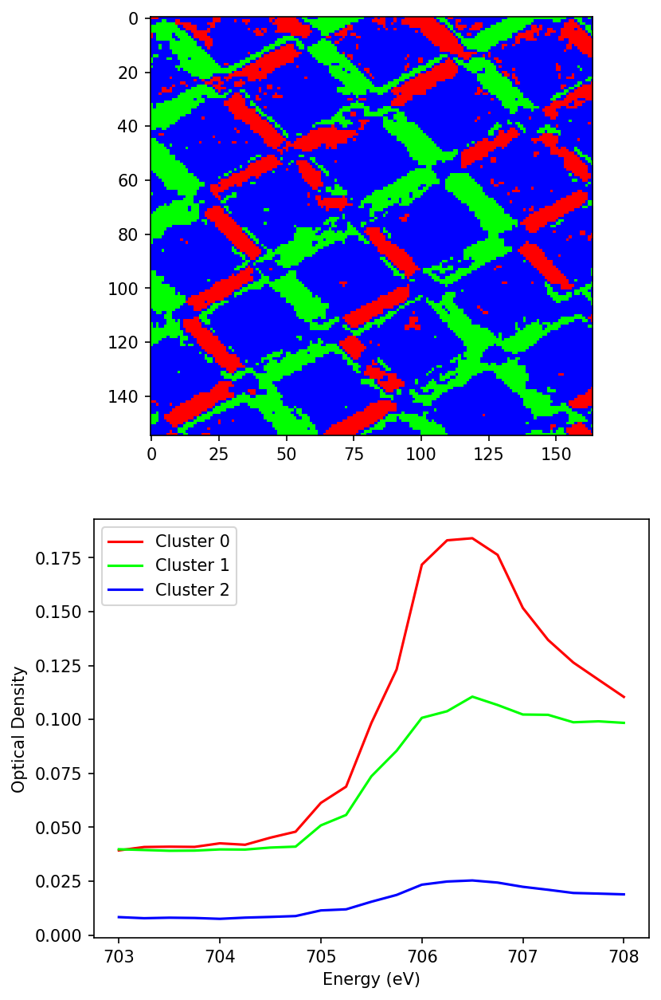

In [24]:
SI_left_stack.calc_OD()
SI_left_stack.calc_PCA(nPC = 4, pcaOffset = 1, nClusters = 3)
SI_left_stack.display_PCA()

We can also turn this into an RGB plot. This is possibly more useful for other samples where you may have different chemical species to map across the sample.

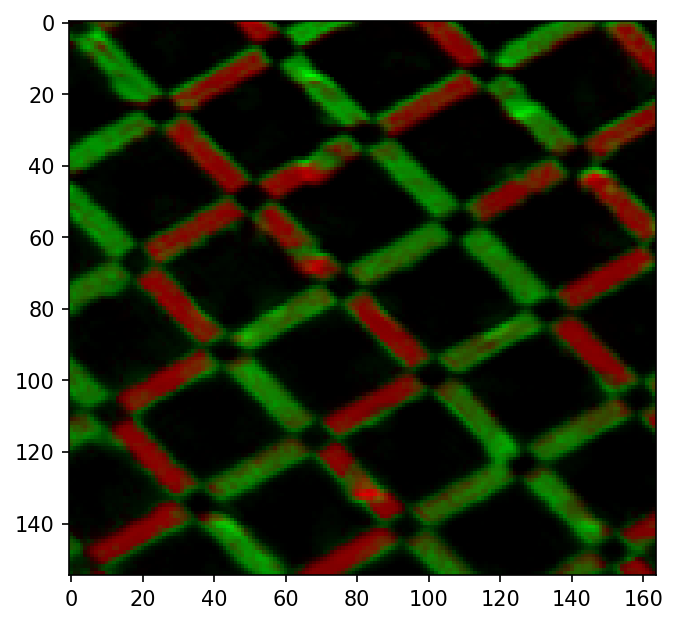

In [25]:
cluster_a = 0
cluster_b = 1
plt.imshow(SI_left_stack.rgbMap([SI_left_stack.clusterSpectra[cluster_a],SI_left_stack.clusterSpectra[cluster_b]],(1,1,0)))
plt.show()

## XMCD

The XMCD is calculated by subtracting the left polarized images from the right. We have a script set up to do that here.

In [39]:
xmcd = XMCD_stack('241213130','241213131',autoprocess = True)

In [28]:
plt.ioff()

In [29]:
animate_data(xmcd.xmcd_data,xmcd.energies)

In [30]:
animate_data(xmcd.xmcd_phase,xmcd.energies)

We can do PCA on the XMCD and see if that makes it more clear. Remember to turn back on matplotlib plotting. We are mostly interested in this for being able to plot spectra.

In [41]:
%%capture
plt.ion()
plt.show()

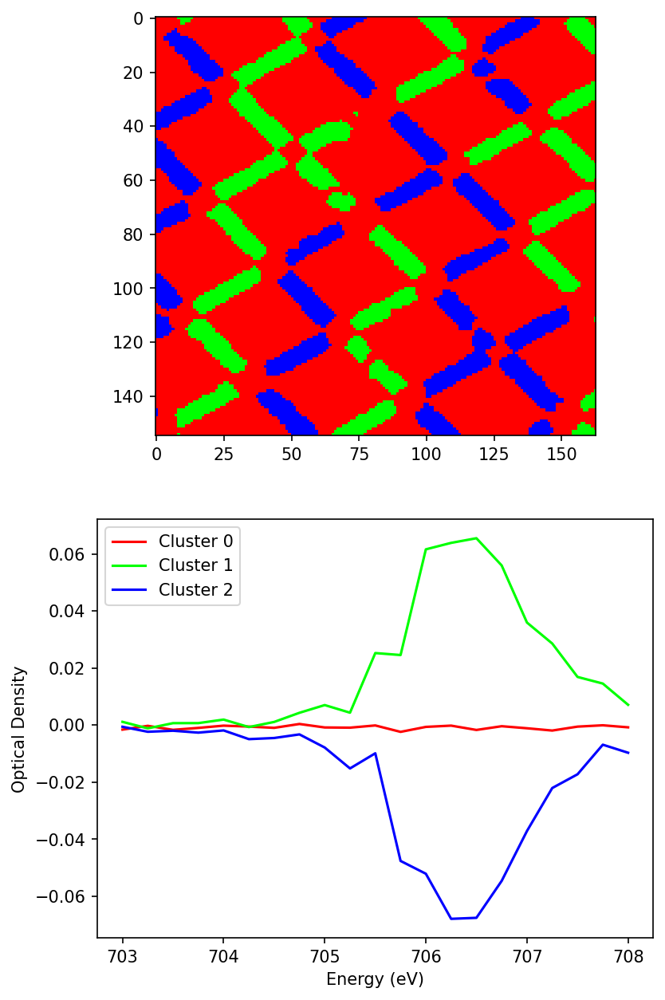

In [42]:
xmcd.xmcd_stack.calc_PCA(nPC = 4, pcaOffset = 0, nClusters = 3)
xmcd.xmcd_stack.display_PCA()

Worked great! Now we can use the clusters here with the original stacks to look at the XMCD spectrum. Here I am just taking the average spectrum over the cluster pixels.

In [52]:
xmcd_cluster_a = 1
xmcd_cluster_b = 2

xmcd_left_a = np.sum(xmcd.stack1.od_data*(xmcd.xmcd_stack.clusters == xmcd_cluster_a),axis = (1,2))/np.sum(xmcd.xmcd_stack.clusters == xmcd_cluster_a)
xmcd_left_b = np.sum(xmcd.stack1.od_data*(xmcd.xmcd_stack.clusters == xmcd_cluster_b),axis = (1,2))/np.sum(xmcd.xmcd_stack.clusters == xmcd_cluster_b)
xmcd_right_a = np.sum(xmcd.stack2.od_data*(xmcd.xmcd_stack.clusters == xmcd_cluster_a),axis = (1,2))/np.sum(xmcd.xmcd_stack.clusters == xmcd_cluster_a)
xmcd_right_b = np.sum(xmcd.stack2.od_data*(xmcd.xmcd_stack.clusters == xmcd_cluster_b),axis = (1,2))/np.sum(xmcd.xmcd_stack.clusters == xmcd_cluster_b)

Text(0, 0.5, 'Optical Density')

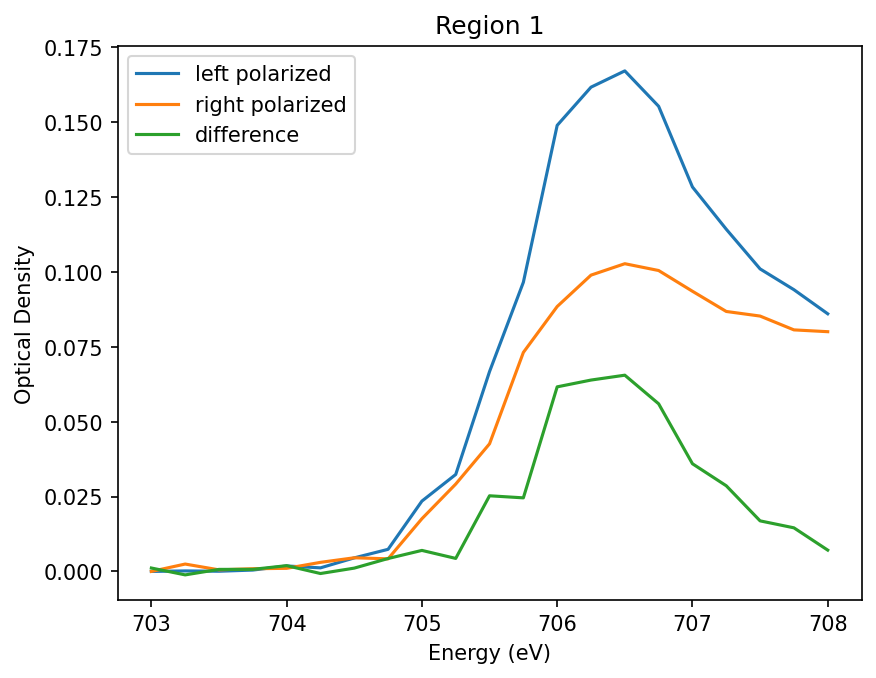

In [58]:
plt.plot(xmcd.energies, xmcd_left_a-xmcd_left_a.min(),label = 'left polarized')
plt.plot(xmcd.energies, xmcd_right_a-xmcd_right_a.min(),label = 'right polarized')
plt.plot(xmcd.energies, xmcd_left_a-xmcd_right_a,label = 'difference')
plt.title('Region 1')
plt.legend()
plt.xlabel('Energy (eV)')
plt.ylabel('Optical Density')

Text(0, 0.5, 'Optical Density')

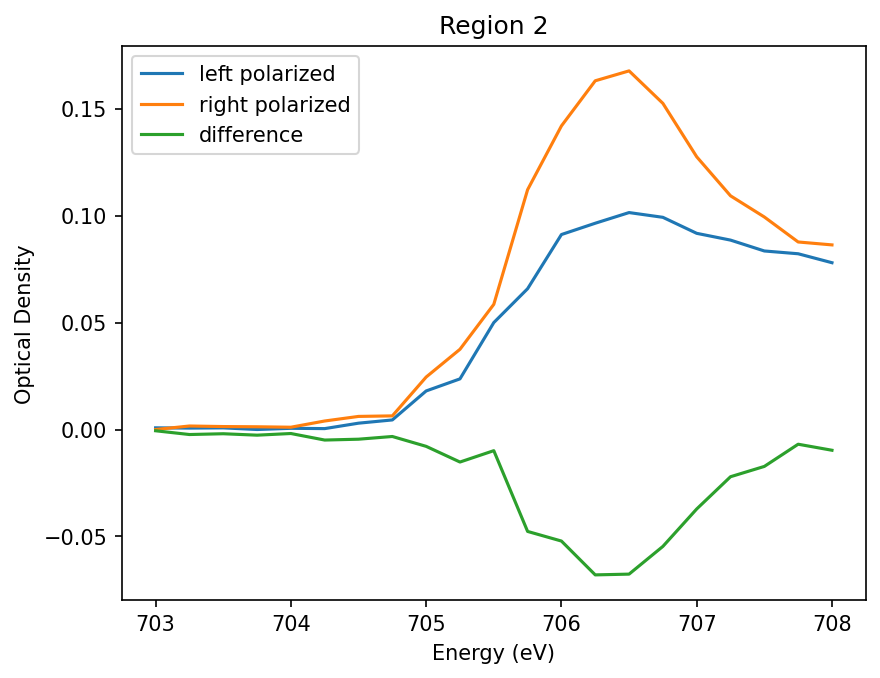

In [60]:
plt.plot(xmcd.energies, xmcd_left_b-xmcd_left_b.min(),label = 'left polarized')
plt.plot(xmcd.energies, xmcd_right_b-xmcd_right_b.min(),label = 'right polarized')
plt.plot(xmcd.energies, xmcd_left_b-xmcd_right_b,label = 'difference')
plt.title('Region 2')
plt.legend()
plt.xlabel('Energy (eV)')
plt.ylabel('Optical Density')

Now let's do the same thing with the phase. Remember, the phase images had different energies where the XMCD was maximized.

In [63]:
xmcd_phase_left_a = np.sum(xmcd.stack1.phase_data*(xmcd.xmcd_stack.clusters == xmcd_cluster_a),axis = (1,2))/np.sum(xmcd.xmcd_stack.clusters == xmcd_cluster_a)
xmcd_phase_left_b = np.sum(xmcd.stack1.phase_data*(xmcd.xmcd_stack.clusters == xmcd_cluster_b),axis = (1,2))/np.sum(xmcd.xmcd_stack.clusters == xmcd_cluster_b)
xmcd_phase_right_a = np.sum(xmcd.stack2.phase_data*(xmcd.xmcd_stack.clusters == xmcd_cluster_a),axis = (1,2))/np.sum(xmcd.xmcd_stack.clusters == xmcd_cluster_a)
xmcd_phase_right_b = np.sum(xmcd.stack2.phase_data*(xmcd.xmcd_stack.clusters == xmcd_cluster_b),axis = (1,2))/np.sum(xmcd.xmcd_stack.clusters == xmcd_cluster_b)

Text(0, 0.5, 'Optical Density')

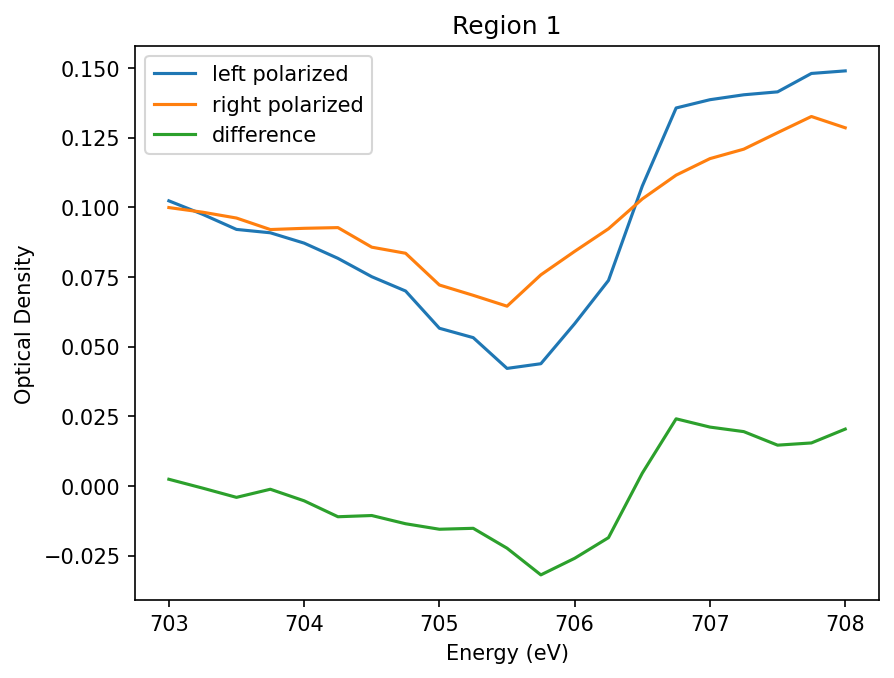

In [65]:
plt.plot(xmcd.energies, xmcd_phase_left_a,label = 'left polarized')
plt.plot(xmcd.energies, xmcd_phase_right_a,label = 'right polarized')
plt.plot(xmcd.energies, xmcd_phase_left_a-xmcd_phase_right_a,label = 'difference')
plt.title('Region 1')
plt.legend()
plt.xlabel('Energy (eV)')
plt.ylabel('Optical Density')

Text(0, 0.5, 'Optical Density')

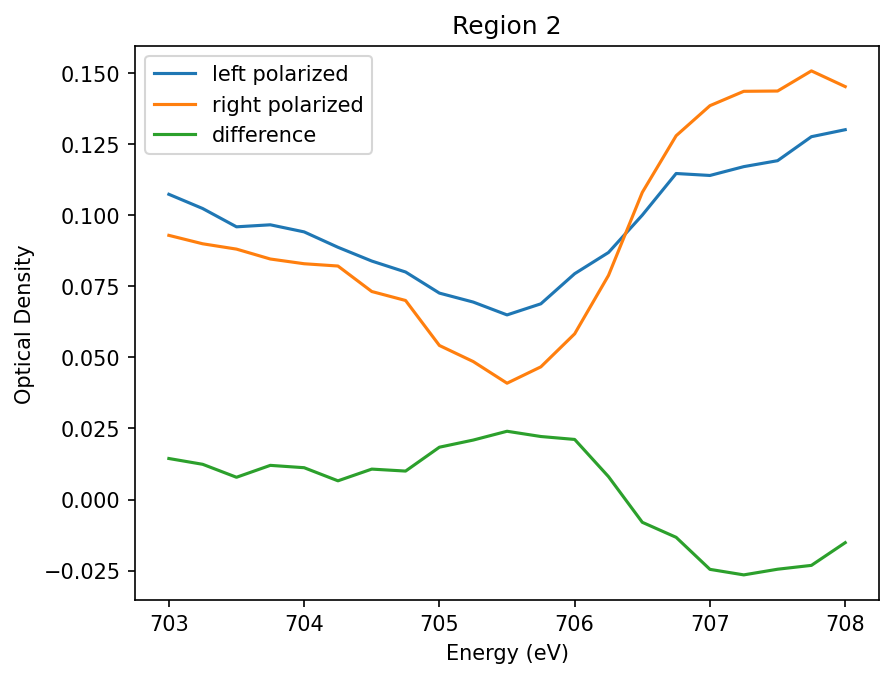

In [67]:
plt.plot(xmcd.energies, xmcd_phase_left_b,label = 'left polarized')
plt.plot(xmcd.energies, xmcd_phase_right_b,label = 'right polarized')
plt.plot(xmcd.energies, xmcd_phase_left_b-xmcd_phase_right_b,label = 'difference')
plt.title('Region 2')
plt.legend()
plt.xlabel('Energy (eV)')
plt.ylabel('Optical Density')